# 1. Read in Data, Filter Noise & Format Data

## Read in Data

In [1]:
# import dependencies
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt # visualizations
import re # regex
import string # handle string
import math # perform mathematical operations
import nltk

# load & format data
# data file used here is on google drive (not on github because file size is too large)
# contains both cleaned text columns and their original contents
df_cleantext = pd.read_csv("C:\\Users\\20jam\\Documents\\GitHub\\omdena-singapore-covid-health\\src\\data\\reddit\\fulldata_clean.csv")
df = df_cleantext[["id", "subreddit", "title", "clean_title", "score", "selftext", "clean_selftext", "upvote_ratio", "created_utc"]]
df = df.replace(np.nan, "", regex = True) # empty selftext

# merge clean_title + clean_selftext && title + selftext
text = [] # the cleaned text data
for rowIndex, row in df.iterrows():
    content = str(row["clean_title"]) + " " + str(row["clean_selftext"])
    text.append(content)
df["text"] = text
original_text = []
for rowIndex, row in df.iterrows():
    content = str(row["title"]) + ". " + str(row["selftext"])
    original_text.append(content)
df["original_text"] = original_text

df = df.drop(["clean_selftext", "selftext", "clean_title", "title"], axis = "columns")
df.head()

,id,subreddit,score,upvote_ratio,created_utc,text,original_text
0,nhxjoa,singapore,117,0.96,2021-05-22,spore psychotic disorder say study,"About 71,600 in S'pore have psychotic disorder..."
1,ng6k8b,askSingapore,8,0.84,2021-05-19,anyone know get tested adult auditory processi...,Anyone know where to get tested as an Adult fo...
2,ksalf9,singapore,202,0.94,2021-01-07,she even time grieve donor ask mum refund boy ...,'She didn't even have time to grieve': Some do...
3,mfnwal,NationalServiceSG,5,0.86,2021-03-29,help adjustment disorder people say half war r...,Help for adjustment disorder. People say half ...
4,l0ac4u,askSingapore,42,1.00,2021-01-19,get assessed eating disorder might eating diso...,Where to get assessed for eating disorders?. I...


## Filter out noise

In [2]:
# remove non english words, abbreviations incomprehensible words
import nltk
nltk.download('words')
words = set(nltk.corpus.words.words())
for rowIndex, row in df.iterrows():
    try:
        string = row["text"]
        new_string = " ".join(w for w in nltk.wordpunct_tokenize(string) if w.lower() in words or not w.isalpha())
        df.loc[rowIndex, "text"] = new_string
    except:
        df.loc[rowIndex, "text"] = ""
df["text"]

[nltk_data] Downloading package words to
[nltk_data]     C:\Users\20jam\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!


0                       spore psychotic disorder say study
1        anyone know get tested adult auditory disorder...
2        she even time grieve donor ask mum refund boy ...
3        help adjustment disorder people say half war r...
4        get assessed eating disorder might eating diso...
                               ...                        
18312    influenza vaccine different brand vaccine avai...
18313    parliament free cervical cancer vaccine female...
18314    lady vaccination yn experience cost clinic cur...
18315            sec girl opt free cervical cancer vaccine
18316    go back polio vaccine checked couple site mini...
Name: text, Length: 18317, dtype: object

## Format data

In [3]:
text_df = df[["subreddit", "text", "original_text"]]
df_grouped = text_df.groupby(by = 'subreddit').agg(lambda x: x.str.cat(sep = " "))
print(df_grouped)

# create document term matrix
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer(analyzer = 'word')
data = cv.fit_transform(df_grouped['text'])
df_dtm = pd.DataFrame(data.toarray(), columns = cv.get_feature_names())
df_dtm.index = df_grouped.index
df_dtm.head()

                                                                text  \
subreddit                                                              
MentalHealthSG     diagnosis confirmed bipolar spectrum personal ...   
NTU                module availability psychology interested deve...   
NationalServiceSG  help adjustment disorder people say half war r...   
SGExams            rant mental disorder long period time sit real...   
SMU_Singapore                                            birth death   
SingaporePoly      anyone know polytechnic student industrial att...   
SingaporeRaw       gym closed court psychiatrist cavalier attitud...   
askSingapore       anyone know get tested adult auditory disorder...   
nus                invisible burnout incoming double major academ...   
singapore          spore psychotic disorder say study she even ti...   
singaporefi        buy life insurance disability insurance depend...   

                                                       original

,aa,aal,aba,aback,abacus,abandon,abandoned,abandonment,abatement,abattoir,...,zombie,zone,zoned,zoning,zoo,zoologist,zoom,zoonotic,zoster,zygote
subreddit,,,,,,,,,,,,,,,,,,,,,
MentalHealthSG,0,0,0,0,0,0,1,1,0,0,...,0,2,0,0,0,0,0,0,0,0
NTU,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,61,0,0,0
NationalServiceSG,2,0,0,1,0,0,0,0,0,0,...,1,1,1,0,0,0,3,0,0,0
SGExams,22,0,88,4,0,3,3,1,0,0,...,5,53,1,13,3,0,237,0,1,1
SMU_Singapore,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


# 2. Ngram Analysis (Comparison btw Pre & Mid Covid)

## For Pre-Covid Posts

"\n# alternative way to display most commonly used single words\ncorpus = []\nnew = df['clean_selftext'].str.split()\nnew = new.values.tolist()\nfor i in new:\n    if type(i) == list:\n        for word in i:\n                corpus.append(word)\n\nfrom collections import Counter\ncounter = Counter(corpus)\nmost = counter.most_common()\nx, y= [], []\nfor word, count in most[:40]:\n    x.append(word)\n    y.append(count)\n    \nsns.barplot(x = y, y = x)\n"

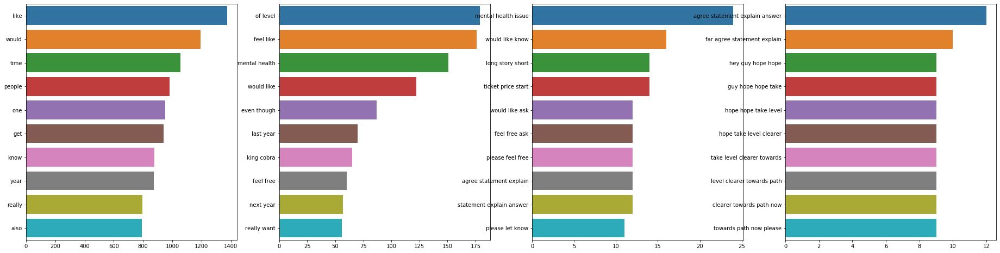

In [4]:
# ngram analysis for pre-covid posts
import datetime
import seaborn as sns
def get_top_ngram(corpus, n = None):
    vec = CountVectorizer(ngram_range = (n, n)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis = 0) 
    words_freq = [(word, sum_words[0, idx]) 
                  for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key = lambda x: x[1], reverse = True)
    return words_freq[:10]

input = df.dropna(subset = ["text"])
pre = input[input["created_utc"] < "2020-01-01"]
fig, axs = plt.subplots(ncols = 4, figsize = (32, 8))
top_n_bigrams = get_top_ngram(pre["text"], 1)
x,y = map(list, zip(*top_n_bigrams)) 
sns.barplot(x = y, y = x, ax = axs[0])
top_n_bigrams = get_top_ngram(pre["text"], 2)
x,y = map(list, zip(*top_n_bigrams)) 
sns.barplot(x = y, y = x, ax = axs[1])
top_tri_grams=get_top_ngram(pre["text"], n = 3)
x,y = map(list, zip(*top_tri_grams))
sns.barplot(x = y, y = x, ax = axs[2])
top_quad_grams=get_top_ngram(pre["text"], n = 4)
x,y = map(list, zip(*top_quad_grams))
sns.barplot(x = y, y = x, ax = axs[3])

"""
# alternative way to display most commonly used single words
corpus = []
new = df['clean_selftext'].str.split()
new = new.values.tolist()
for i in new:
    if type(i) == list:
        for word in i:
                corpus.append(word)

from collections import Counter
counter = Counter(corpus)
most = counter.most_common()
x, y= [], []
for word, count in most[:40]:
    x.append(word)
    y.append(count)
    
sns.barplot(x = y, y = x)
"""

## For Mid-Covid Posts

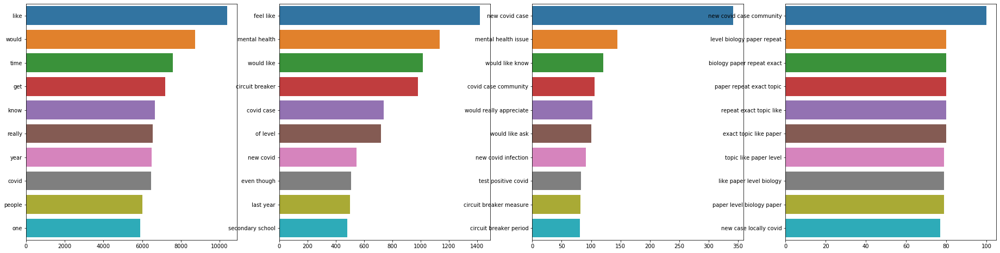

In [5]:
# ngram analysis for mid-covid posts
input = df.dropna(subset = ["text"])
mid = input[input["created_utc"] > "2020-01-01"]
fig, axs = plt.subplots(ncols = 4, figsize = (32, 8))
top_n_bigrams = get_top_ngram(mid["text"], 1)
x,y = map(list, zip(*top_n_bigrams)) 
sns.barplot(x = y, y = x, ax = axs[0])
top_n_bigrams = get_top_ngram(mid["text"], 2)
x,y = map(list, zip(*top_n_bigrams)) 
sns.barplot(x = y, y = x, ax = axs[1])
top_tri_grams=get_top_ngram(mid["text"], n = 3)
x,y = map(list, zip(*top_tri_grams))
sns.barplot(x = y, y = x, ax = axs[2])
top_quad_grams=get_top_ngram(mid["text"], n = 4)
x,y = map(list, zip(*top_quad_grams))
sns.barplot(x = y, y = x, ax = axs[3])

# 3. WordCloud (Comparison btw Pre & Mid Covid for every Subreddit)

## Further filter words which do not contribute to giving insight about subject matter at hand

In [6]:
# permanently remove rows with empty clean_selftext
df = df[df["text"] != ""]
df

,id,subreddit,score,upvote_ratio,created_utc,text,original_text
0,nhxjoa,singapore,117,0.96,2021-05-22,spore psychotic disorder say study,"About 71,600 in S'pore have psychotic disorder..."
1,ng6k8b,askSingapore,8,0.84,2021-05-19,anyone know get tested adult auditory disorder...,Anyone know where to get tested as an Adult fo...
2,ksalf9,singapore,202,0.94,2021-01-07,she even time grieve donor ask mum refund boy ...,'She didn't even have time to grieve': Some do...
3,mfnwal,NationalServiceSG,5,0.86,2021-03-29,help adjustment disorder people say half war r...,Help for adjustment disorder. People say half ...
4,l0ac4u,askSingapore,42,1.00,2021-01-19,get assessed eating disorder might eating diso...,Where to get assessed for eating disorders?. I...
...,...,...,...,...,...,...,...
18312,b0hzfi,singapore,7,0.71,2019-03-13,influenza vaccine different brand vaccine avai...,Influenza Vaccine. Are there different brands ...
18313,axxk5x,singapore,126,0.97,2019-03-06,parliament free cervical cancer vaccine female...,Parliament: Free opt-in cervical cancer vaccin...
18314,ap5vn0,singapore,1,0.73,2019-02-10,lady vaccination yn experience cost clinic cur...,"[ladies] HPV vaccination - y/n, experience, co..."
18315,blzm57,singapore,152,0.98,2019-05-08,sec girl opt free cervical cancer vaccine,93% of Sec 1 girls opt for free cervical cance...


In [7]:
# keep only noun (N), verb (V)
import nltk
subject = []
def get_subject(txt):
    matter =  " ".join([word for (word, pos) in nltk.pos_tag(nltk.word_tokenize(txt)) if pos[0] in ["N", "V"]])
    subject.append(matter)
for rowIndex, row in df.iterrows():
    get_subject(row["text"])
# print(len(subject))
# print(subject)
df["clean subject matter"] = subject
df

,id,subreddit,score,upvote_ratio,created_utc,text,original_text,clean subject matter
0,nhxjoa,singapore,117,0.96,2021-05-22,spore psychotic disorder say study,"About 71,600 in S'pore have psychotic disorder...",disorder say study
1,ng6k8b,askSingapore,8,0.84,2021-05-19,anyone know get tested adult auditory disorder...,Anyone know where to get tested as an Adult fo...,anyone know get tested adult disorder know chi...
2,ksalf9,singapore,202,0.94,2021-01-07,she even time grieve donor ask mum refund boy ...,'She didn't even have time to grieve': Some do...,time donor ask mum refund boy disorder
3,mfnwal,NationalServiceSG,5,0.86,2021-03-29,help adjustment disorder people say half war r...,Help for adjustment disorder. People say half ...,help adjustment disorder people say war report...
4,l0ac4u,askSingapore,42,1.00,2021-01-19,get assessed eating disorder might eating diso...,Where to get assessed for eating disorders?. I...,get eating disorder eating disorder want eatin...
...,...,...,...,...,...,...,...,...
18312,b0hzfi,singapore,7,0.71,2019-03-13,influenza vaccine different brand vaccine avai...,Influenza Vaccine. Are there different brands ...,vaccine brand vaccine difference going friend ...
18313,axxk5x,singapore,126,0.97,2019-03-06,parliament free cervical cancer vaccine female...,Parliament: Free opt-in cervical cancer vaccin...,cancer vaccine female sec student year
18314,ap5vn0,singapore,1,0.73,2019-02-10,lady vaccination yn experience cost clinic cur...,"[ladies] HPV vaccination - y/n, experience, co...",vaccination yn experience cost clinic vaccinat...
18315,blzm57,singapore,152,0.98,2019-05-08,sec girl opt free cervical cancer vaccine,93% of Sec 1 girls opt for free cervical cance...,girl opt cancer vaccine


In [8]:
# remove any additional words manually (edit this accordingly to rm words you see in wordcloud but do not want in)
filter = ["get", "go", "going", "got", "hi"]
def rm_words(txt):
    return " ".join([word for word in nltk.word_tokenize(txt) if word not in filter])
for rowIndex, row in df.iterrows():
    df.loc[rowIndex, "clean subject matter"] = rm_words(row["clean subject matter"])

## Word Clouds for Individual Subreddit before Covid

In [9]:
# pre-covid
pre_subject = df[df["created_utc"] < "2020-01-01"]
text_df = pre_subject[["subreddit", "clean subject matter"]]
df_grouped = text_df.groupby(by = 'subreddit').agg(lambda x: x.str.cat(sep = " "))

# create document term matrix
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer(analyzer = "word")
data = cv.fit_transform(df_grouped["clean subject matter"])
df_dtm = pd.DataFrame(data.toarray(), columns = cv.get_feature_names())
df_dtm.index = df_grouped.index

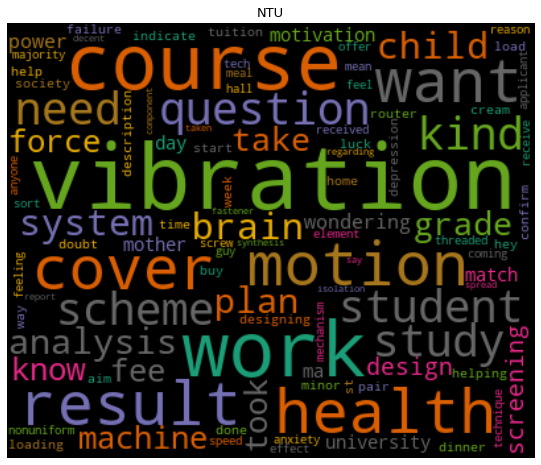

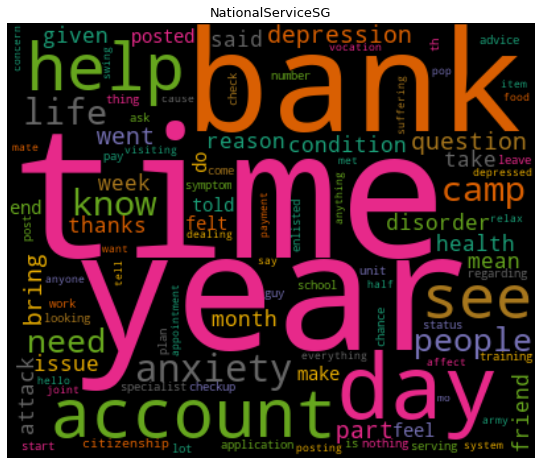

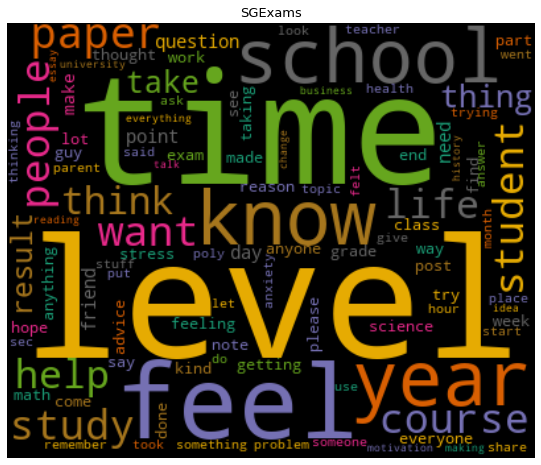

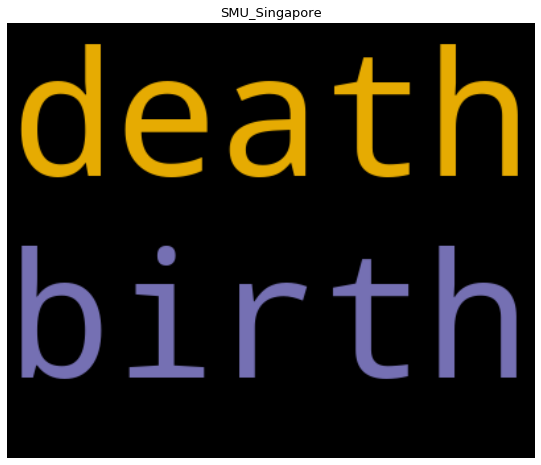

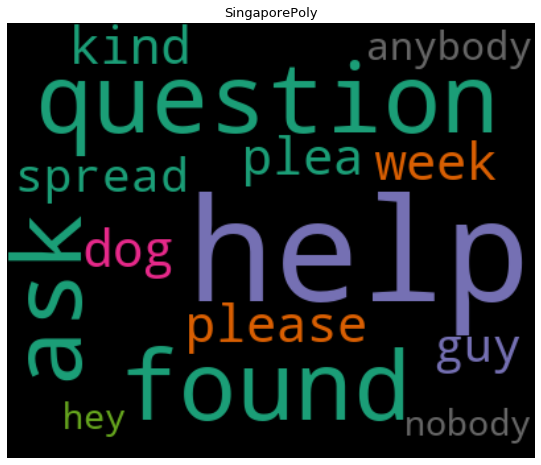

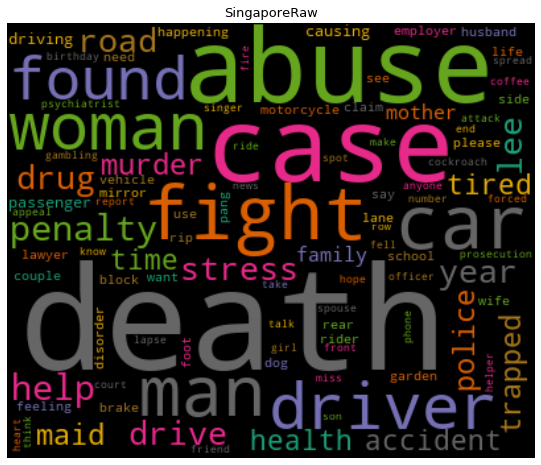

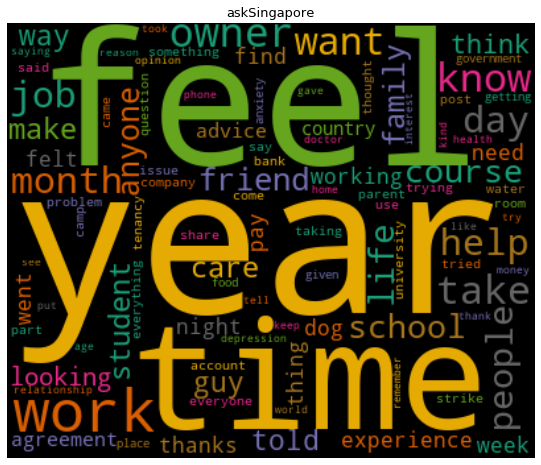

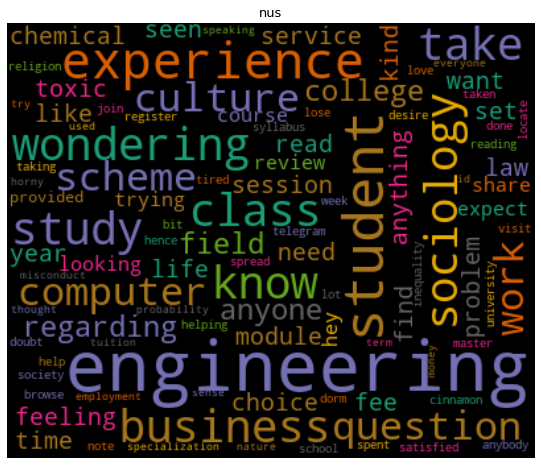

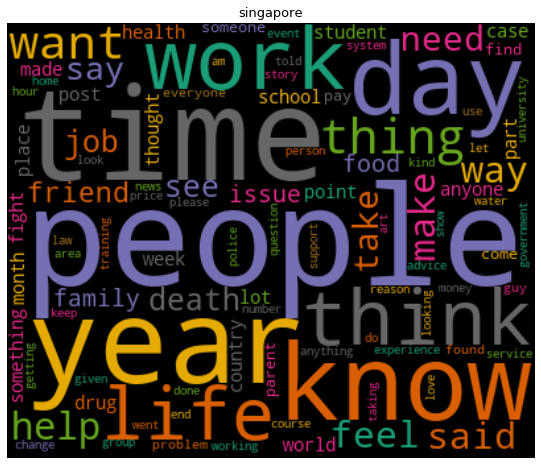

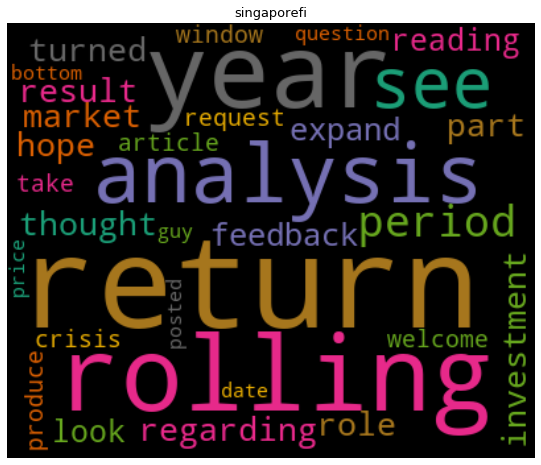

In [10]:
# generate wordcloud
from wordcloud import WordCloud
from textwrap import wrap

def generate_wordcloud(data,title):
  wc = WordCloud(width = 400, height = 330, max_words = 100, colormap = "Dark2").generate_from_frequencies(data)
  plt.figure(figsize = (10,8))
  plt.imshow(wc, interpolation = 'bilinear')
  plt.axis("off")
  plt.title('\n'.join(wrap(title,60)), fontsize = 13)
  plt.show()
  
# transpose document term matrix
df_dtm = df_dtm.transpose()

# plotting word cloud for subreddit
for index, product in enumerate(df_dtm.columns):
  generate_wordcloud(df_dtm[product].sort_values(ascending = False), product)

In [11]:
df[df["subreddit"] == "SMU_Singapore"]

,id,subreddit,score,upvote_ratio,created_utc,text,original_text,clean subject matter
17357,eg6m47,SMU_Singapore,1,0.57,2019-12-27,birth death,The birth of Galvatron_The death of Starscream.,birth death


In [12]:
df[df["subreddit"] == "SingaporePoly"]

,id,subreddit,score,upvote_ratio,created_utc,text,original_text,clean subject matter
373,o2p8fy,SingaporePoly,0,0.5,2021-06-18,anyone know polytechnic student industrial att...,Does anyone know ITE and Polytechnic student's...,anyone know student attachment fall anyone stu...
2371,nubcio,SingaporePoly,1,1.0,2021-06-07,aptitude test currently y aptitude test anybod...,DMB APTITUDE TEST. I'm currently a Y2 NITEC ap...,test y test anybody know expect tip
2982,o1ndzf,SingaporePoly,3,0.8,2021-06-17,need help complete survey hi y student need he...,"In need of help to complete a survey. Hi, im a...",need help complete survey y student need help ...
3036,oa43d6,SingaporePoly,7,0.9,2021-06-29,need help binary math question decimal bit bin...,Need Help With Binary Maths Question. What is ...,need help binary math question bit represent
5050,itr2pr,SingaporePoly,1,1.0,2020-09-16,need advice poly hey guy ask question get info...,"Need some advice on Poly or JC. Hey guys, just...",need advice poly hey guy ask question informat...
8916,gnjsiv,SingaporePoly,1,1.0,2020-05-20,poly experience hi everyone am morning awhile ...,"My poly experience. Hi everyone, it's 4am in t...",experience everyone am morning awhile thought ...
8917,nsf6p6,SingaporePoly,1,1.0,2021-06-04,top leading country covid vaccination,Top 10 Leading Countries In the COVID-19 Vacci...,leading country vaccination
10145,l2lny8,SingaporePoly,1,1.0,2021-01-22,double student going taking month apply securi...,DISM @SP or DBA @SP. I'm a double sci student ...,student taking month apply security management...
10767,i6e9a4,SingaporePoly,1,1.0,2020-08-09,guy whether course continue,You guys think/know whether or not your course...,guy course continue
10768,o6zwy6,SingaporePoly,1,1.0,2021-06-24,telegram student know made school life lot fun...,Telegram Chatbot for SP Students!. Heyy!! I kn...,student know made school life lot fun made fun...


## Word Cloud for Individual Subreddit during Covid

In [13]:
# mid-covid
mid_subject = df[df["created_utc"] > "2020-01-01"]
text_df = mid_subject[["subreddit", "clean subject matter"]]
df_grouped = text_df.groupby(by = "subreddit").agg(lambda x: x.str.cat(sep = " "))

# create document term matrix
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer(analyzer = "word")
data = cv.fit_transform(df_grouped["clean subject matter"])
df_dtm = pd.DataFrame(data.toarray(), columns = cv.get_feature_names())
df_dtm.index = df_grouped.index

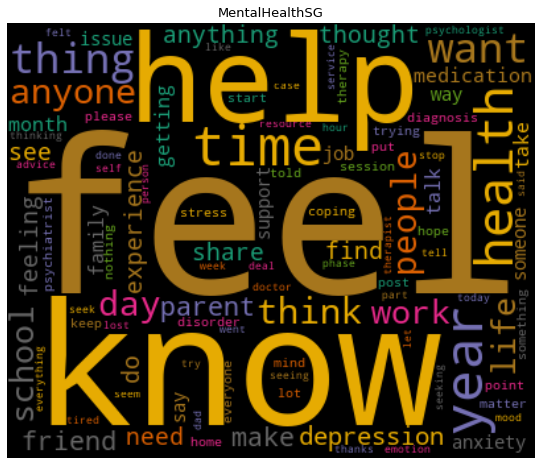

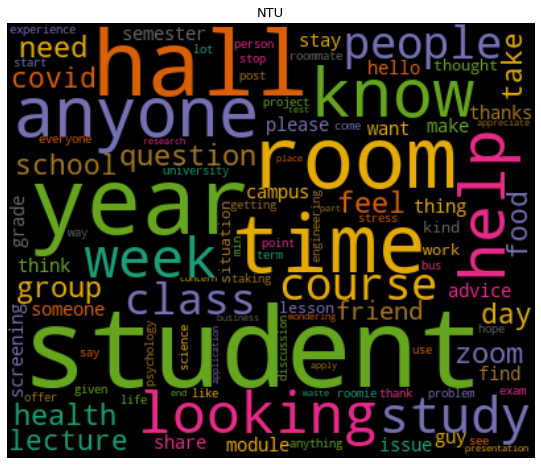

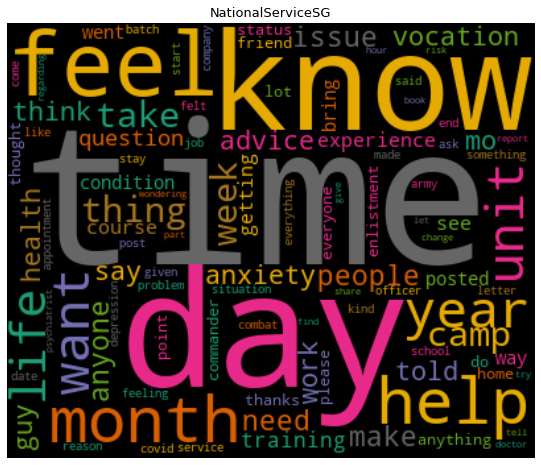

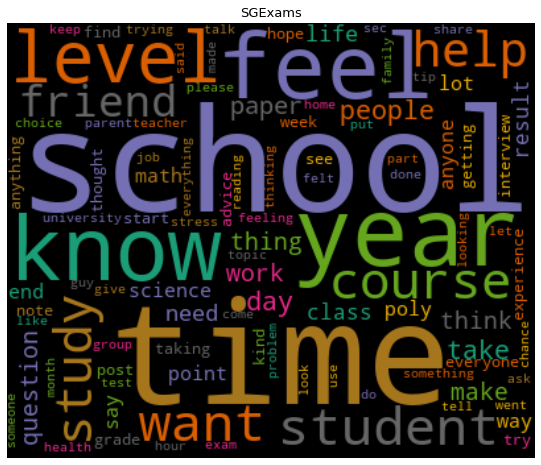

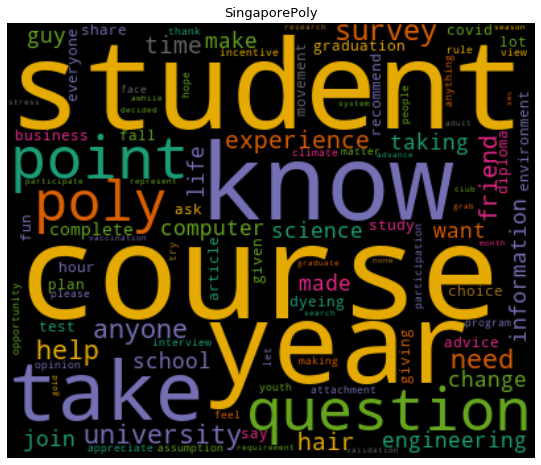

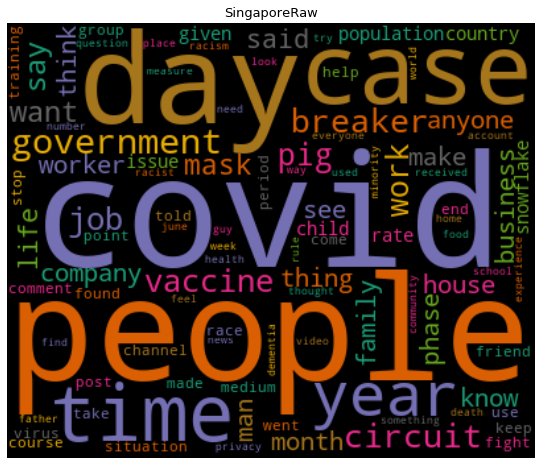

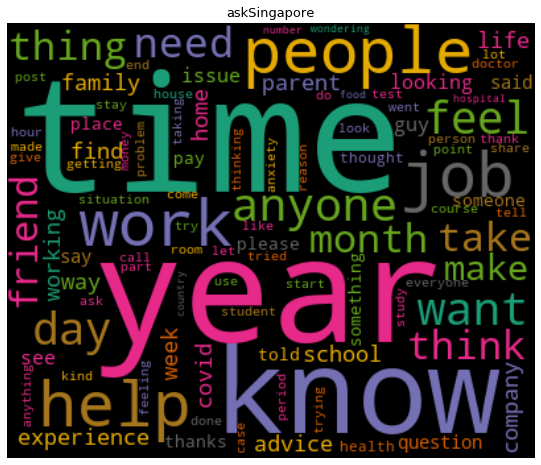

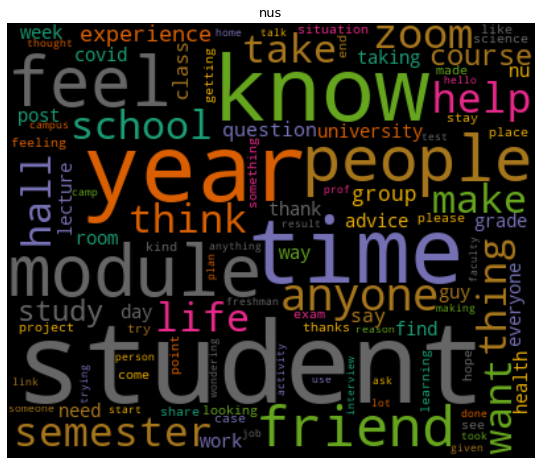

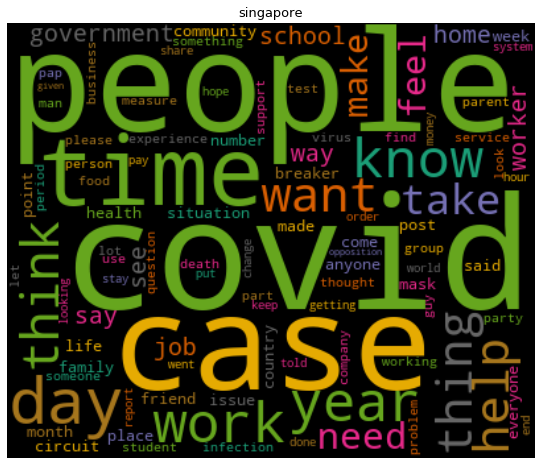

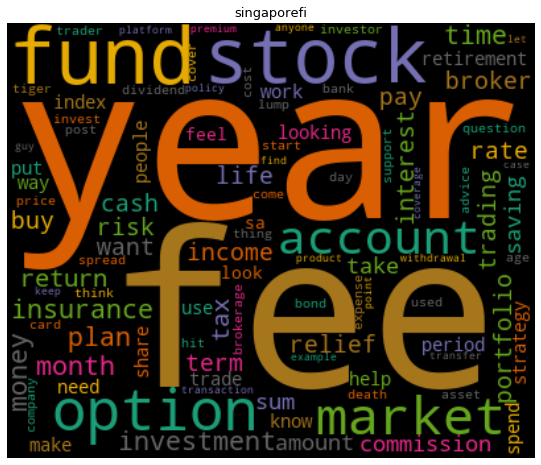

In [14]:
# generate wordcloud
from wordcloud import WordCloud
from textwrap import wrap

def generate_wordcloud(data,title):
  wc = WordCloud(width = 400, height = 330, max_words = 100, colormap = "Dark2").generate_from_frequencies(data)
  plt.figure(figsize = (10,8))
  plt.imshow(wc, interpolation = 'bilinear')
  plt.axis("off")
  plt.title('\n'.join(wrap(title,60)), fontsize = 13)
  plt.show()
  
# transpose document term matrix
df_dtm = df_dtm.transpose()

# plotting word cloud for subreddit
for index,product in enumerate(df_dtm.columns):
  generate_wordcloud(df_dtm[product].sort_values(ascending = False), product)

# 4. Sentiment Polarity Analysis

## Top 3 Post with Highest & Lowest Polarity Score 

In [15]:
# calculate sentiment polarity
import numpy as np
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')
sentiment = SentimentIntensityAnalyzer()
df['sentiment score'] = df["text"].apply(lambda x: sentiment.polarity_scores(x))
df["sentiment score"] = df["sentiment score"].apply(pd.Series)["compound"]
"""
from textblob import TextBlob
def polarity(text):
    try:
        return TextBlob(text).sentiment.polarity
    except:
        if type(text) == float:
            pass
"""

# view top (from bottom and above) output of sentiment polarity analysis
print("Top 3 Most Positive Posts:")
for rowIndex, row in df.sort_values(by = ["sentiment score"], ascending = False).head(3).iterrows():
    content = " ".join(row["original_text"].split())
    print("POST INDEX {}: \n".format(rowIndex + 1), content)
    print()
print()
print()
print("Top 3 Most Negative Posts:")
for rowIndex, row in df.sort_values(by = ["sentiment score"], ascending = True).head(3).iterrows():
    content = " ".join(row["original_text"].split())
    print("POST INDEX {}: \n".format(rowIndex + 1), content)
    print()
"""
Alternatively: 
print("Top 3 Most Positive Posts:")
for index, txt in enumerate(df.iloc[df['polarity'].sort_values(ascending = False)[:3].index]["selftext"]):
  print('Post {}:\n'.format(index + 1), txt)
print()
print("Top 3 Most Negative Posts:")
for index, txt in enumerate(df.iloc[df['polarity'].sort_values(ascending = True)[:3].index]["selftext"]):
  print('Post {}:\n'.format(index + 1),txt)
"""


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\20jam\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


Top 3 Most Positive Posts:
POST INDEX 1599: 
 [UNI] ALL ABOUT NUS LAW 1.0! (+ AMA). Hello! I’m a current NUS Law year 3 student. This post is inspired by the other similar posts about other NUS faculties which are extremely well-written so I hope this will meet the lofty standards set by the other faculties =). This post seeks to provide **general information for those considering about NUS Law or a career in law since the other schools (SMU and SUSS) have greatly similar law curriculum as well as to clarify some doubts about a legal education in our local universities**. I understand that unfortunately there is no physical open house this year and frankly I am unsure about the school's plan for outreach because the information doesn't seem to be available via the school portal. I will edit this post and update you guys as soon as the school provides some information. Nonetheless, I will be happy to engage in discussions on this thread or via a pm and I will do my best to answer to you

'\nAlternatively: \nprint("Top 3 Most Positive Posts:")\nfor index, txt in enumerate(df.iloc[df[\'polarity\'].sort_values(ascending = False)[:3].index]["selftext"]):\n  print(\'Post {}:\n\'.format(index + 1), txt)\nprint()\nprint("Top 3 Most Negative Posts:")\nfor index, txt in enumerate(df.iloc[df[\'polarity\'].sort_values(ascending = True)[:3].index]["selftext"]):\n  print(\'Post {}:\n\'.format(index + 1),txt)\n'

## Sentiment Polarity Score Comparison btw Pre & Post Covid for every Subreddit

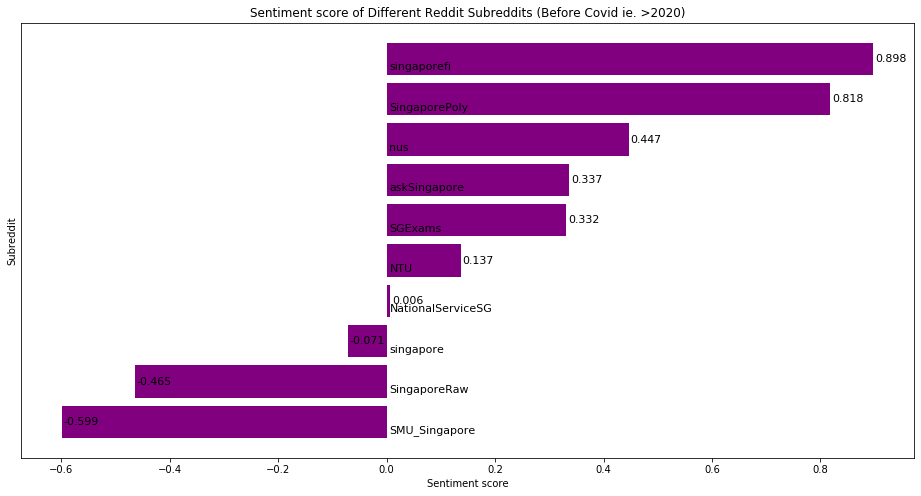

In [16]:
# precovid stat calc
pre = df[df["created_utc"] < "2020-01-01"]
subreddit_sentiment_sorted=pd.DataFrame(pre.groupby('subreddit')['sentiment score'].mean().sort_values(ascending=True))
# plot setting
plt.figure(figsize=(16,8))
plt.xlabel('Sentiment score')
plt.ylabel('Subreddit')
plt.title('Sentiment score of Different Reddit Subreddits (Before Covid ie. >2020)')
sentiment_graph=plt.barh(np.arange(len(subreddit_sentiment_sorted.index)),subreddit_sentiment_sorted['sentiment score'],color='purple',)
# writing names on bar
for bar,subreddit in zip(sentiment_graph,subreddit_sentiment_sorted.index):
  plt.text(0.005, bar.get_y() + 0.2,'{}'.format(subreddit),va='center',fontsize=11,color='black')
# writing sentiment values on graph
for bar,sentiment in zip(sentiment_graph,subreddit_sentiment_sorted['sentiment score']):
  plt.text(bar.get_width() + 0.003, bar.get_y() + 0.4,'%.3f'%sentiment,va='center', fontsize = 11, color = 'black')
# display plot
plt.yticks([])
plt.show()

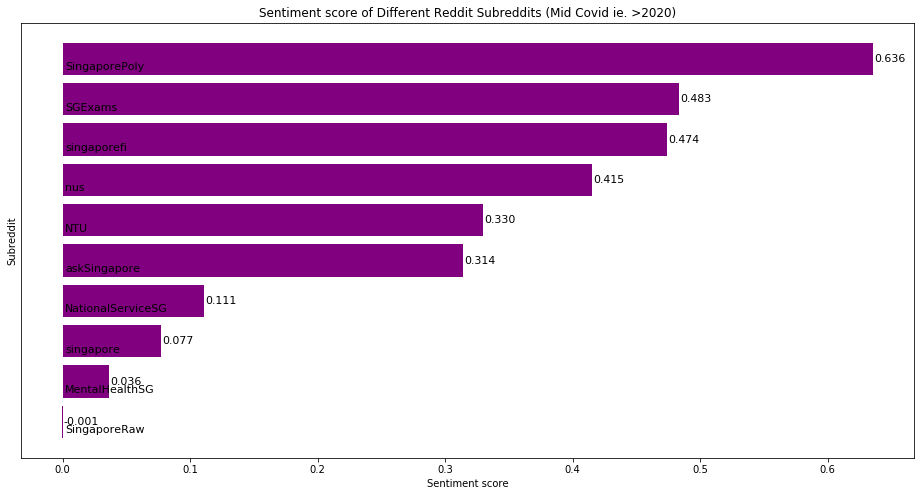

In [17]:
# midcovid stat calc
mid = df[df["created_utc"] > "2020-01-01"]
subreddit_sentiment_sorted=pd.DataFrame(mid.groupby('subreddit')['sentiment score'].mean().sort_values(ascending=True))
# plot setting
plt.figure(figsize=(16,8))
plt.xlabel('Sentiment score')
plt.ylabel('Subreddit')
plt.title('Sentiment score of Different Reddit Subreddits (Mid Covid ie. >2020)')
sentiment_graph=plt.barh(np.arange(len(subreddit_sentiment_sorted.index)),subreddit_sentiment_sorted['sentiment score'],color='purple',)
# writing names on bar
for bar,subreddit in zip(sentiment_graph,subreddit_sentiment_sorted.index):
  plt.text(0.002,bar.get_y()+0.2,'{}'.format(subreddit),va='center',fontsize=11,color='black')
# writing sentiment values on graph
for bar,sentiment in zip(sentiment_graph,subreddit_sentiment_sorted['sentiment score']):
  plt.text(bar.get_width()+0.001,bar.get_y()+0.4,'%.3f'%sentiment,va='center', fontsize = 11, color = 'black')
# display plot
plt.yticks([])
plt.show()

## Distribution of Polarity Score Comparison btw Overall, Pre & Mid Covid Period

Text(0.5, 0.98, 'Sentiment Score Distribution for Overall Data')

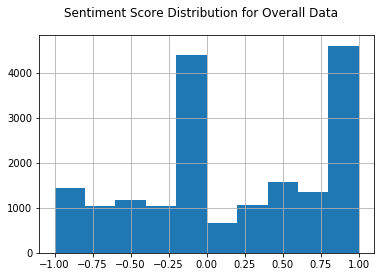

In [18]:
# polarity histogram (overall)
import pylab as pl
df['sentiment score'].hist()
pl.suptitle("Sentiment Score Distribution for Overall Data")

Text(0.5, 0.98, 'Sentiment Score Distribution for Pre-Covid Posts')

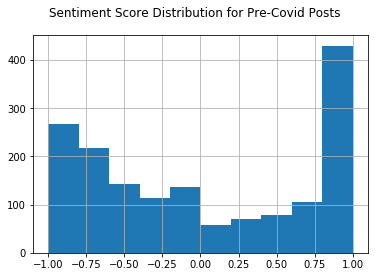

In [19]:
# polarity histogram for pre-covid period
pre['sentiment score'].hist()
pl.suptitle("Sentiment Score Distribution for Pre-Covid Posts")

Text(0.5, 0.98, 'Sentiment Score Distribution for Mid-Covid Posts')

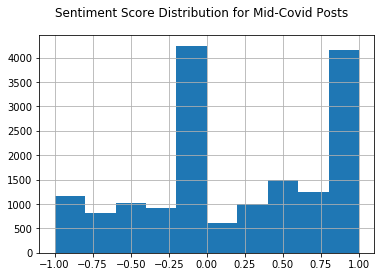

In [20]:
# polarity histogram for mid-covid period
mid['sentiment score'].hist()
pl.suptitle("Sentiment Score Distribution for Mid-Covid Posts")

## Compare Frequency of Words under different Sentiment Groups Used

"\nalternative method:\n# sentiment analysis using vader\nfrom nltk.sentiment.vader import SentimentIntensityAnalyzer\nnltk.download('vader_lexicon')\nsid = SentimentIntensityAnalyzer()\n\ndef get_vader_score(sent):\n    # polarity score returns dictionary\n    ss = sid.polarity_scores(sent)\n    # return ss\n    return np.argmax(list(ss.values())[:-1])\n\ndf['polarity_t'] = input['clean_selftext'].    map(lambda x: get_vader_score(x))\npolarity = df['polarity_t'].replace({0:'neg',1:'neu',2:'pos'})\n\nplt.bar(polarity.value_counts().index,\n        polarity.value_counts())\n\n# display sample with negative sentiment\ndf[df['polarity_t']==2]['clean_selftext']\n"

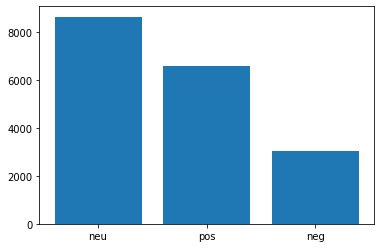

In [21]:
# compare freq of sentiment (using polarity)
def sentiment(x):
    if x < -0.5:
        return 'neg'
    elif x >= -0.5 and x <= 0.5:
        return 'neu'
    else:
        return 'pos'

df['sentiment class'] = df['sentiment score'].\
   map(lambda x: sentiment(x))
plt.bar(df['sentiment class'].value_counts().index,
        df['sentiment class'].value_counts())

"""
alternative method:
# sentiment analysis using vader
from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')
sid = SentimentIntensityAnalyzer()

def get_vader_score(sent):
    # polarity score returns dictionary
    ss = sid.polarity_scores(sent)
    # return ss
    return np.argmax(list(ss.values())[:-1])

df['polarity_t'] = input['clean_selftext'].\
    map(lambda x: get_vader_score(x))
polarity = df['polarity_t'].replace({0:'neg',1:'neu',2:'pos'})

plt.bar(polarity.value_counts().index,
        polarity.value_counts())

# display sample with negative sentiment
df[df['polarity_t']==2]['clean_selftext']
"""

In [22]:
# display examples of negative sentiment instances
df[df['sentiment class']=='neg']['original_text'].head()

2    'She didn't even have time to grieve': Some do...
3    Help for adjustment disorder. People say half ...
4    Where to get assessed for eating disorders?. I...
6    [RANT] Mental disorders. After o's I have this...
7    Downpes from adjustment disorder. Facing sever...
Name: original_text, dtype: object

# 5. Sentiment Across Time

In [23]:
import altair as alt
import pandas as pd
import vaderSentiment
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
def sentiment_scores(sentence):
    sentence['positive'] = 0
    sentence['negative'] = 0
    sentence['neutral'] = 0
    # Create a SentimentIntensityAnalyzer object.
    sid_obj = SentimentIntensityAnalyzer()

    # polarity_scores method of SentimentIntensityAnalyzer
    # object gives a sentiment dictionary.
    # which contains pos, neg, neu, and compound scores.
    sentiment_dict = sid_obj.polarity_scores(str(sentence['text']))
    sentence['positive_percentage'] = sentiment_dict['pos']*100
    sentence['negative_percentage'] = sentiment_dict['neg']*100
    sentence['neutral_percentage'] = sentiment_dict['neu']*100
     
    # decide sentiment as positive, negative and neutral
    if sentiment_dict['compound'] >= 0.05 :
        sentence['positive'] = 1
    elif sentiment_dict['compound'] <= - 0.05 :
        sentence['negative'] = 1
    else :
        sentence['neutral'] = 1 
    return sentence

sentiment_analysis = df.apply(sentiment_scores, axis=1)
sentiment_analysis_group = sentiment_analysis.groupby('created_utc')['positive', 'negative', 'neutral'].sum().reset_index()
sentiment_analysis_df = sentiment_analysis_group[['positive', 'negative', 'neutral', 'created_utc']].melt(id_vars='created_utc')
sentiment_analysis_df.head(2)
selection = alt.selection_multi(fields=['color'], bind='legend')

sentiment_trend = alt.Chart(sentiment_analysis_df, title='Sentiment Analysis Trend').mark_line().encode(
        x=alt.X(
            "created_utc",
            axis=alt.Axis(title="created_utc")
        ),
        y='value',
        color='variable:N',
    ).properties(
        width=800,
        height=400
    ).configure_axisX(
        labelAngle=-45,
    ).interactive().add_selection(
        selection
    )

sentiment_trend

C:\Users\20jam\AppData\Local\Programs\Python\Python37\lib\site-packages\ipykernel_launcher.py:30: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.


alt.Chart(...)

## Further Analysis of Sentiment with Wordcloud

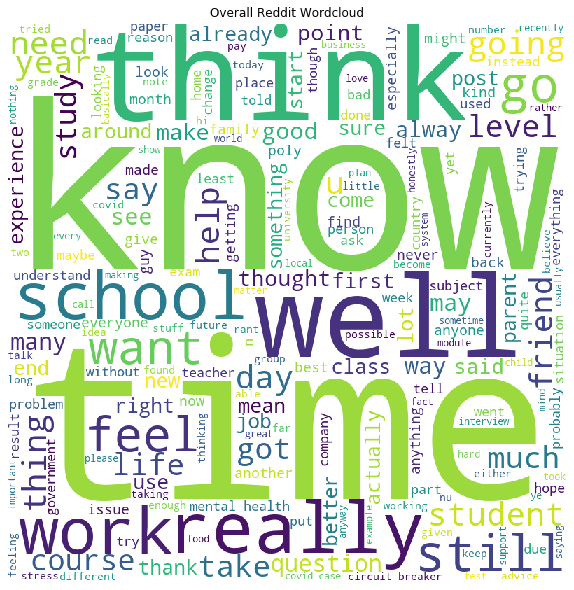

In [24]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

comment_words = ''
stopwords = set(STOPWORDS)
stopwords.add('im')
stopwords.add('one')
stopwords.add('people')
stopwords.add('even')
 
# iterate through the csv file
for columns, details in df.iterrows():
    val = str(details['text'])
    tokens = val.split()
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
    comment_words += " ".join(tokens)+" "
 
word_cloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10).generate(comment_words)
 
# plot the WordCloud image                      
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(word_cloud)
plt.title('Overall Reddit Wordcloud')
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

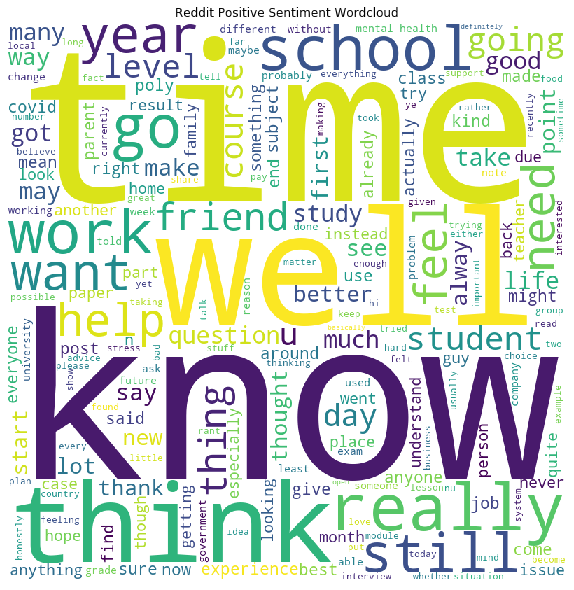

In [25]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

comment_words = ''
stopwords = set(STOPWORDS)
stopwords.add('im')
stopwords.add('one')
stopwords.add('people')
stopwords.add('even')
 
# iterate through the csv file
for columns, details in sentiment_analysis[sentiment_analysis['positive']==1].iterrows():
    val = str(details['text'])

    tokens = val.split()
     
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
     
    comment_words += " ".join(tokens)+" "
 
word_cloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10).generate(comment_words)
 
# plot the WordCloud image                      
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(word_cloud)
plt.title('Reddit Positive Sentiment Wordcloud')
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

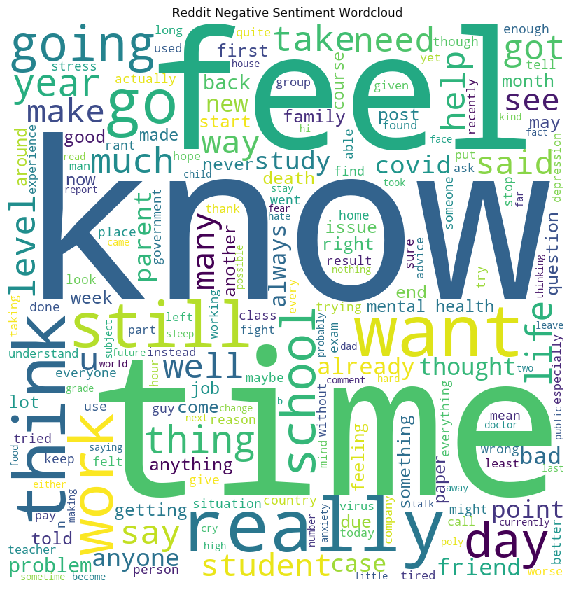

In [26]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

comment_words = ''
stopwords = set(STOPWORDS)
stopwords.add('im')
stopwords.add('one')
stopwords.add('people')
stopwords.add('even')
 
# iterate through the csv file
for columns, details in sentiment_analysis[sentiment_analysis['negative']==1].iterrows():
    val = str(details['text'])

    tokens = val.split()
     
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
     
    comment_words += " ".join(tokens)+" "
 
word_cloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10).generate(comment_words)
 
# plot the WordCloud image                      
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(word_cloud)
plt.title('Reddit Negative Sentiment Wordcloud')
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

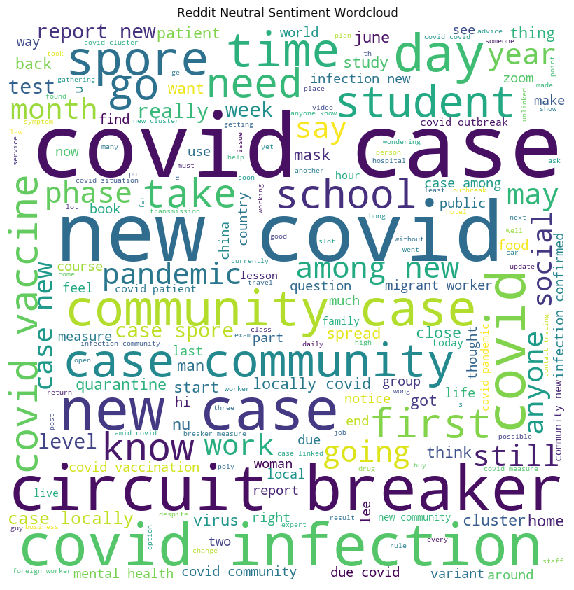

In [27]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

comment_words = ''
stopwords = set(STOPWORDS)
stopwords.add('im')
stopwords.add('one')
stopwords.add('people')
stopwords.add('even')
 
# iterate through the csv file
for columns, details in sentiment_analysis[sentiment_analysis['neutral']==1].iterrows():
    val = str(details['text'])

    tokens = val.split()
     
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
     
    comment_words += " ".join(tokens)+" "
 
word_cloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10).generate(comment_words)
 
# plot the WordCloud image                      
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(word_cloud)
plt.title('Reddit Neutral Sentiment Wordcloud')
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

# 6. Frquency of Post over Time

## Frequency of Posts Across Time

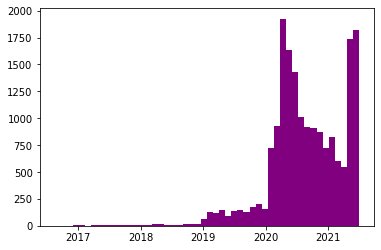

In [28]:
"""
Very pretty plot, but there is bug for x axis! -- note to Rhey 
Should use this rather than the one below if code can be debugged

import altair as alt
import pandas as pd
date_count = df.groupby('created_utc')['created_utc'].count().to_frame()
date_count = date_count.rename(columns={'created_utc': 'count'})
date_count = date_count.reset_index()
alt.renderers.enable('default') 
selection = alt.selection_multi(fields=['count'], bind='legend')
trend = alt.Chart(date_count, title="Reddit Overall Trend").mark_line().encode(
    x=alt.X(
        "created_utc",
        axis=alt.Axis(title="created_utc")
    ),
    y='count',
).properties(
    width=800,
    height=400
).configure_axisX(
    labelAngle=-45,
).interactive().add_selection(
    selection
)
trend
"""

import matplotlib.pyplot as plt
import matplotlib.dates as mdates

dates = mdates.datestr2num(df["created_utc"].tolist())
fig, ax = plt.subplots(1,1)
locator = mdates.AutoDateLocator()
ax.xaxis.set_major_locator(locator)
ax.hist(dates, bins=50, color='purple')
ax.xaxis.set_major_locator(mdates.YearLocator())
ax.xaxis.set_major_formatter(mdates.AutoDateFormatter(locator))
plt.show()

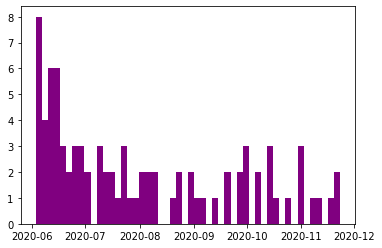

In [29]:
# for specfic subreddit:
# note that mentalhealthsg is created only Jun 3, 2020
mentalhealth = df[df["subreddit"] == "MentalHealthSG"]
dates = mentalhealth["created_utc"].tolist()
dates = mdates.datestr2num(mentalhealth["created_utc"].tolist())
fig, ax = plt.subplots(1,1)
locator = mdates.AutoDateLocator()
ax.xaxis.set_major_locator(locator)
ax.hist(dates, bins=50, color='purple')
# ax.xaxis.set_major_locator(mdates.YearLocator())
ax.xaxis.set_major_formatter(mdates.AutoDateFormatter(locator))

# 7. Empath Analysis

In [30]:
# calculate empath
import empath
from empath import Empath
lexicon = Empath()
def empath_analysis(text):
    analysis = lexicon.analyze(text, normalize = True)
    analysis = [emp for emp, val in analysis.items() if val != 0]
    return analysis
df["empath"] = df["text"].apply(lambda x: empath_analysis(x))

def empath_analysis_raw(text):
    analysis = lexicon.analyze(text, normalize = True)
    return analysis
df["empath_raw"] = df["text"].apply(lambda x: empath_analysis_raw(x))
df.head()

,id,subreddit,score,upvote_ratio,created_utc,text,original_text,clean subject matter,sentiment score,sentiment class,empath,empath_raw
0,nhxjoa,singapore,117,0.96,2021-05-22,spore psychotic disorder say study,"About 71,600 in S'pore have psychotic disorder...",disorder say study,-0.4019,neu,"[health, school, college, reading, speaking, s...","{'help': 0.0, 'office': 0.0, 'dance': 0.0, 'mo..."
1,ng6k8b,askSingapore,8,0.84,2021-05-19,anyone know get tested adult auditory disorder...,Anyone know where to get tested as an Adult fo...,anyone know tested adult disorder know child n...,-0.4032,neu,"[help, office, dance, domestic_work, aggressio...","{'help': 0.015625, 'office': 0.010416666666666..."
2,ksalf9,singapore,202,0.94,2021-01-07,she even time grieve donor ask mum refund boy ...,'She didn't even have time to grieve': Some do...,time donor ask mum refund boy disorder,-0.6486,neg,"[domestic_work, family, masculine, health, suf...","{'help': 0.0, 'office': 0.0, 'dance': 0.0, 'mo..."
3,mfnwal,NationalServiceSG,5,0.86,2021-03-29,help adjustment disorder people say half war r...,Help for adjustment disorder. People say half ...,help adjustment disorder people say war report...,-0.5994,neg,"[help, office, wedding, sleep, medical_emergen...","{'help': 0.07692307692307693, 'office': 0.0769..."
4,l0ac4u,askSingapore,42,1.00,2021-01-19,get assessed eating disorder might eating diso...,Where to get assessed for eating disorders?. I...,eating disorder eating disorder want eating ha...,-0.7003,neg,"[help, money, wedding, domestic_work, medical_...","{'help': 0.015267175572519083, 'office': 0.0, ..."


In [31]:
# update pre and mid df
pre = df[df["created_utc"] < "2020-01-01"]
mid = df[df["created_utc"] >= "2020-01-01"]

# count pre
from collections import Counter
counter_pre = Counter()
counter_mid = Counter()
for text in pre["empath"]:
    for word in text:
        counter_pre[word] += 1
counter_pre.most_common(10)

[('negative_emotion', 1104),
 ('violence', 1013),
 ('communication', 817),
 ('speaking', 808),
 ('business', 765),
 ('positive_emotion', 762),
 ('work', 737),
 ('giving', 703),
 ('death', 702),
 ('school', 702)]

In [32]:
# count mid
for text in mid["empath"]:
    for word in text:
        counter_mid[word] += 1
counter_mid.most_common(10)

[('work', 7195),
 ('business', 7186),
 ('school', 7117),
 ('communication', 7071),
 ('college', 7006),
 ('speaking', 6978),
 ('negative_emotion', 6883),
 ('giving', 6199),
 ('positive_emotion', 6033),
 ('help', 6012)]

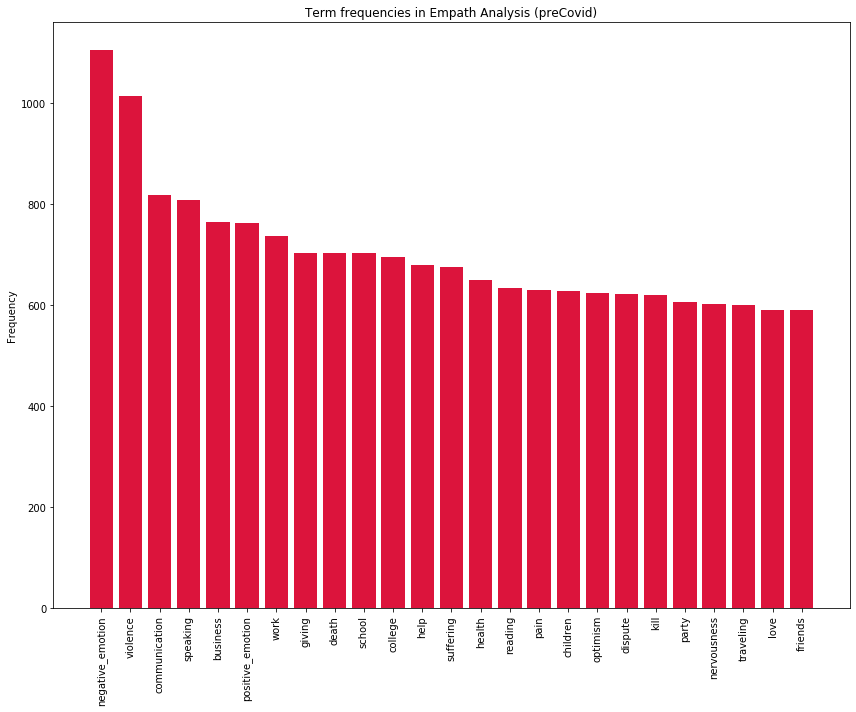

In [33]:
# pre
import matplotlib.pyplot as plt
import seaborn as sns

fig, ax = plt.subplots(figsize = (12, 10))
y = []
x = []
for tag, count in counter_pre.most_common(25):
    y.append(count)
    x.append(tag)
plt.bar(x, y, color = "crimson")
plt.title("Term frequencies in Empath Analysis (preCovid)")
plt.ylabel("Frequency")

plt.xticks(rotation = 90)
plt.tight_layout()
plt.show()

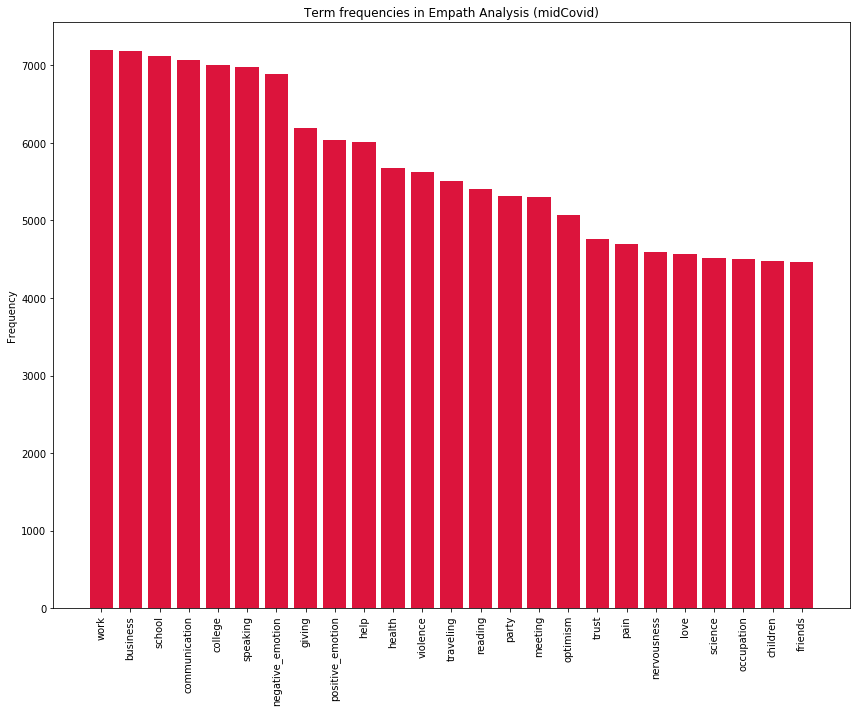

In [34]:
# mid
fig, ax = plt.subplots(figsize = (12, 10))
y = []
x = []
for tag, count in counter_mid.most_common(25):
    y.append(count)
    x.append(tag)
plt.bar(x, y, color = "crimson")
plt.title("Term frequencies in Empath Analysis (midCovid)")
plt.ylabel("Frequency")

plt.xticks(rotation = 90)
plt.tight_layout()
plt.show()

# 8. Others

## Types of Words Used

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\20jam\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


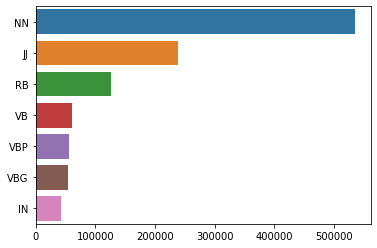

In [35]:
# freq barplot for type of words used - noun, adj, verb etc.
from collections import Counter
import spacy
nlp = spacy.load("en_core_web_sm")
from spacy import displacy
import nltk
#nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
from nltk.tokenize import word_tokenize

def pos(text):
    pos = nltk.pos_tag(word_tokenize(text))
    pos = list(map(list,zip(*pos)))[1]
    return pos

tags = df['text'].apply(lambda x : pos(x))
tags = [x for l in tags for x in l]
counter = Counter(tags)

x,y = list(map(list,zip(*counter.most_common(7))))
sns.barplot(x = y,y = x)

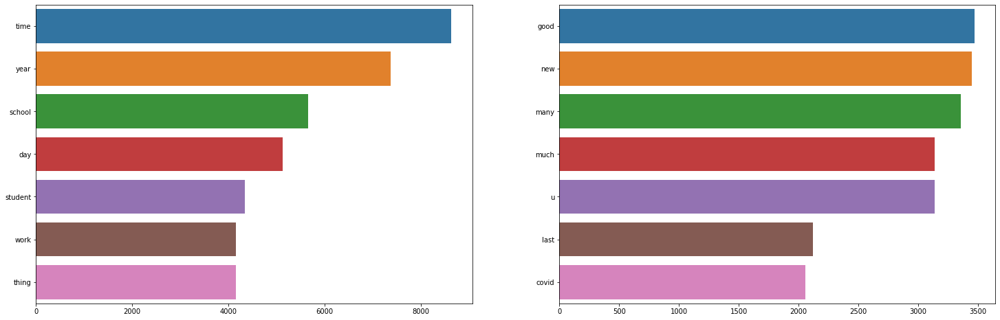

In [36]:
# most commonly used -
from collections import Counter
from nltk.tokenize import word_tokenize
def get_adjs(text, type_tag): # tag = "NN" noun, "JJ" adjectives, 
    adj = []
    pos = nltk.pos_tag(word_tokenize(text))
    for word, tag in pos:
        if tag == type_tag:
            adj.append(word)
    return adj

fig, axs = plt.subplots(ncols = 2, figsize = (25, 8))
# noun
words = df["text"].apply(lambda x : get_adjs(x, type_tag = "NN"))
words = [x for l in words for x in l]
counter = Counter(words)
x,y = list(map(list,zip(*counter.most_common(7))))
sns.barplot(x = y,y = x, ax = axs[0])
# adjective
words = df["text"].apply(lambda x : get_adjs(x, type_tag = "JJ"))
words = [x for l in words for x in l]
counter = Counter(words)
x,y = list(map(list,zip(*counter.most_common(7))))
sns.barplot(x = y,y = x, ax = axs[1])

# 9. Prepare Data for Visualization Team

In [44]:
# add contain_covid, contain_sg, contain_mental_health and relevancy columns
import re
keywords = []
mental_health_keywords = ["depression", "mental illness", "unalive", "social anxiety", "loneliness", "stress", "lonely", "isolation", "suicide",
                            "abuse", "death", "post traumatic stress disorder", "no motivation", "therapy", "trauma", "counselling", 
                            "mood disorder", "mood swings", "mental health", "angst", "emotion", "phobia", "addiction", "stigma", "self-harm",
                            "neurosis", "abuse", "disorder", "dependence", "socialize", "help", "dead", "melancholia", "dysthemia", "tired", 
                            "trapped", "paranoia", "overwhelmed", "irritable", "bipolar", "psychologist", "well-being", "imh", "sos", 
                            "counsellor", "toxic", "insominia", "drugs", "fight", "self-esteem"]
pandemic_keywords = ["covid-19", "pandemic", "restriction", "social distancing", "circuit breaker", "pre-covid", "coronavirus", "quarantine", 
                        "lockdown", "wfh", "tighter measures", "phase 2", "vaccine", "community cases", "epidemic", "mask", "asymptomatic",
                        "fatality rate", "clinical trial", "contact tracing", "contactless", "national emergency", "transmission", "screening", 
                        "testing", "hospital", "healthcare worker", "death", "symptomatic", "symptoms", "isolation", "safe distancing",
                        "physical distancing", "outbreak", "cluster", "spread", "hygiene", "crisis", "new normal", "uncertainty", "zoom", 
                        "retrenchment", "variant", "heightened alert", "stay home notice", "shn", "hbl", "safe entry", "home based learning",
                        "frontline", "school closure", "job insecurity"]

for rowIndex, row in df.iterrows():
    content = row["text"]
    original_content = row["original_text"]
    row_key = []
    for word in content.split():
        if word in mental_health_keywords:
            row_key.append(word)
        if word in pandemic_keywords:
            row_key.append(word)
    for word in original_content.split():
        if word in mental_health_keywords:
            row_key.append(word)
        if word in pandemic_keywords:
            row_key.append(word)
    if row_key == []:
        row_key = ""
    else:
        row_key = list(set(row_key))
    keywords.append(row_key)
df["keywords"] = keywords
df.head()

,id,subreddit,text,original_text,score,upvote_ratio,created_utc,clean subject matter,sentiment score,sentiment class,empath,empath_raw,keywords
0,nhxjoa,singapore,spore psychotic disorder say study,"About 71,600 in S'pore have psychotic disorder...",117,0.96,2021-05-22,disorder say study,-0.4019,neu,"[health, school, college, reading, speaking, s...","{'help': 0.0, 'office': 0.0, 'dance': 0.0, 'mo...",[disorder]
1,ng6k8b,askSingapore,anyone know get tested adult auditory disorder...,Anyone know where to get tested as an Adult fo...,8,0.84,2021-05-19,anyone know tested adult disorder know child n...,-0.4032,neu,"[help, office, dance, domestic_work, aggressio...","{'help': 0.015625, 'office': 0.010416666666666...","[stress, help, disorder]"
2,ksalf9,singapore,she even time grieve donor ask mum refund boy ...,'She didn't even have time to grieve': Some do...,202,0.94,2021-01-07,time donor ask mum refund boy disorder,-0.6486,neg,"[domestic_work, family, masculine, health, suf...","{'help': 0.0, 'office': 0.0, 'dance': 0.0, 'mo...",[disorder]
3,mfnwal,NationalServiceSG,help adjustment disorder people say half war r...,Help for adjustment disorder. People say half ...,5,0.86,2021-03-29,help adjustment disorder people say war report...,-0.5994,neg,"[help, office, wedding, sleep, medical_emergen...","{'help': 0.07692307692307693, 'office': 0.0769...","[help, disorder, imh]"
4,l0ac4u,askSingapore,get assessed eating disorder might eating diso...,Where to get assessed for eating disorders?. I...,42,1.00,2021-01-19,eating disorder eating disorder want eating ha...,-0.7003,neg,"[help, money, wedding, domestic_work, medical_...","{'help': 0.015267175572519083, 'office': 0.0, ...","[psychologist, disorder]"


In [45]:
counter = 0
for rowIndex, row in df.iterrows():
    if row["keywords"] == "":
        counter += 1
print(counter)
df = df[df["keywords"] != ""]
df.head()

0


,id,subreddit,text,original_text,score,upvote_ratio,created_utc,clean subject matter,sentiment score,sentiment class,empath,empath_raw,keywords
0,nhxjoa,singapore,spore psychotic disorder say study,"About 71,600 in S'pore have psychotic disorder...",117,0.96,2021-05-22,disorder say study,-0.4019,neu,"[health, school, college, reading, speaking, s...","{'help': 0.0, 'office': 0.0, 'dance': 0.0, 'mo...",[disorder]
1,ng6k8b,askSingapore,anyone know get tested adult auditory disorder...,Anyone know where to get tested as an Adult fo...,8,0.84,2021-05-19,anyone know tested adult disorder know child n...,-0.4032,neu,"[help, office, dance, domestic_work, aggressio...","{'help': 0.015625, 'office': 0.010416666666666...","[stress, help, disorder]"
2,ksalf9,singapore,she even time grieve donor ask mum refund boy ...,'She didn't even have time to grieve': Some do...,202,0.94,2021-01-07,time donor ask mum refund boy disorder,-0.6486,neg,"[domestic_work, family, masculine, health, suf...","{'help': 0.0, 'office': 0.0, 'dance': 0.0, 'mo...",[disorder]
3,mfnwal,NationalServiceSG,help adjustment disorder people say half war r...,Help for adjustment disorder. People say half ...,5,0.86,2021-03-29,help adjustment disorder people say war report...,-0.5994,neg,"[help, office, wedding, sleep, medical_emergen...","{'help': 0.07692307692307693, 'office': 0.0769...","[help, disorder, imh]"
4,l0ac4u,askSingapore,get assessed eating disorder might eating diso...,Where to get assessed for eating disorders?. I...,42,1.00,2021-01-19,eating disorder eating disorder want eating ha...,-0.7003,neg,"[help, money, wedding, domestic_work, medical_...","{'help': 0.015267175572519083, 'office': 0.0, ...","[psychologist, disorder]"


In [47]:
df = df[["id", "subreddit", "text", "original_text", "score", "upvote_ratio", "created_utc", "clean subject matter", 'sentiment score', "sentiment class", "empath", "keywords"]]
df.head()

,id,subreddit,text,original_text,score,upvote_ratio,created_utc,clean subject matter,sentiment score,sentiment class,empath,keywords
0,nhxjoa,singapore,spore psychotic disorder say study,"About 71,600 in S'pore have psychotic disorder...",117,0.96,2021-05-22,disorder say study,-0.4019,neu,"[health, school, college, reading, speaking, s...",[disorder]
1,ng6k8b,askSingapore,anyone know get tested adult auditory disorder...,Anyone know where to get tested as an Adult fo...,8,0.84,2021-05-19,anyone know tested adult disorder know child n...,-0.4032,neu,"[help, office, dance, domestic_work, aggressio...","[stress, help, disorder]"
2,ksalf9,singapore,she even time grieve donor ask mum refund boy ...,'She didn't even have time to grieve': Some do...,202,0.94,2021-01-07,time donor ask mum refund boy disorder,-0.6486,neg,"[domestic_work, family, masculine, health, suf...",[disorder]
3,mfnwal,NationalServiceSG,help adjustment disorder people say half war r...,Help for adjustment disorder. People say half ...,5,0.86,2021-03-29,help adjustment disorder people say war report...,-0.5994,neg,"[help, office, wedding, sleep, medical_emergen...","[help, disorder, imh]"
4,l0ac4u,askSingapore,get assessed eating disorder might eating diso...,Where to get assessed for eating disorders?. I...,42,1.00,2021-01-19,eating disorder eating disorder want eating ha...,-0.7003,neg,"[help, money, wedding, domestic_work, medical_...","[psychologist, disorder]"


In [146]:
df.to_csv("C:\\Users\\20jam\\Documents\\GitHub\\omdena-singapore-covid-health\\src\\data\\reddit\\cutsom_data_for_viz.csv")